# 1. Import Libraries

In [1]:
import os
import cv2
import subprocess
import numpy as np
import pandas as pd
import time
import gc
import datetime
import tempfile
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from google.cloud import storage
from collections import defaultdict
from IPython.display import Video, display


# 2. Setup Environment

In [3]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
!gcloud auth login # Authenticates your identity for general gcloud CLI command use e.g. gcloud storage cp, gcloud compute, gsutil
!gcloud auth application-default login # Authenticates your environment for API access e.g., storage.Client()

Go to the following link in your browser, and complete the sign-in prompts:

    https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=32555940559.apps.googleusercontent.com&redirect_uri=https%3A%2F%2Fsdk.cloud.google.com%2Fauthcode.html&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fuserinfo.email+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fcloud-platform+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fappengine.admin+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fsqlservice.login+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fcompute+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Faccounts.reauth&state=FpfTyLvUe1MzHe6ARggDHqMvBwKdao&prompt=consent&token_usage=remote&access_type=offline&code_challenge=p3ZkiYsFo2nQrC-bRzkISWj6G-QIjLryZM5h-UUToaU&code_challenge_method=S256

Once finished, enter the verification code provided in your browser: 4/0Ab32j92YDfsCfp1Va7ALQ64PCkqT5MtURxChOHthLeOA8pL8uK0fOeBDrZkIqtZMSmUxQw

You are now logged in as [quincygithub@gmail.com].
Your current project

In [5]:
# setup variables
base_dir = "/"
bucket_name = 'brb-traffic'
video_path='videos'
os.makedirs(video_path, exist_ok=True)

In [6]:
# Create a client to interact with Google Cloud Storage
client = storage.Client(project="brb-traffic")

# Reference the bucket containing your videos
bucket = client.bucket("brb-traffic")

/usr/local/lib/python3.12/dist-packages/google/auth/_default.py:108: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


In [7]:
# List all files
blobs = bucket.list_blobs()
all_files = [blob.name for blob in blobs]

# Extract top-level folders
top_level_folders = set(f.split('/')[0] for f in all_files)
print("Top-level folders:", top_level_folders)

Top-level folders: {'added', 'normanniles3', 'normanniles4', 'normanniles2', 'normanniles1'}


In [8]:
# Build file folder paths dictionary: {friendly_name: prefix/}
compressed_gcs_paths_dict = {folder: folder+'/' for folder in top_level_folders}
print(compressed_gcs_paths_dict)

{'added': 'added/', 'normanniles3': 'normanniles3/', 'normanniles4': 'normanniles4/', 'normanniles2': 'normanniles2/', 'normanniles1': 'normanniles1/'}


# 3. Dataset Overview

Two versions of the dataset are provided for this competition:

• **Compressed dataset**: approximately 130.89 GB

• **Original uncompressed dataset**: approximately 581 GB


Both versions include 18,716 videos and contain the complete train and test input datasets, with the only difference being the storage format.

**Accessing the data**

Participants can download the dataset through any of the following methods:

• Kaggle

• Google Drive links(as shown in this notebook)

• uTorrent files

• Google Cloud Storage
Full access instructions are available on the competition data page:
🔗 https://zindi.africa/competitions/barbados-traffic-analysis-challenge/data

In [9]:
# Function: Count MP4 files in a GCS "folder"
def gcs_folder_stats(bucket, prefix):
    """
    Count the number of .mp4 files and compute total size in GB
    for a given GCS folder (prefix).

    Args:
        bucket: google.cloud.storage.bucket.Bucket object
        prefix: str, folder path inside the bucket (e.g., "n1/")

    Returns:
        total_files: int, number of MP4 files
        total_gb: float, total size in GB
    """
    total_files = 0
    total_size = 0  # in bytes

    # List all objects in the bucket under the given prefix
    blobs = bucket.list_blobs(prefix=prefix)

    # Loop through each object
    for blob in blobs:
        # Only count .mp4 files
        if blob.name.lower().endswith(".mp4"):
            total_files += 1
            total_size += blob.size  # size is in bytes

    # Convert bytes → GB
    total_gb = total_size / (1024 * 1024 * 1024)
    return total_files, total_gb

In [10]:
# Function: Collect stats for multiple GCS folders
def collect_gcs_stats(prefix_dict, label):
    """
    Loop through a dictionary of GCS folder prefixes and print stats
    for each folder, as well as totals.

    Args:
        prefix_dict: dict, e.g., {"n1": "n1/", "n2": "n2/"}
        label: str, a label to print (e.g., "compressed")
    """
    print(f"\n--- {label.upper()} DATASETS ---")

    grand_files = 0
    grand_gb = 0

    # Iterate over each folder in the dictionary
    for name, prefix in prefix_dict.items():
        files, gb = gcs_folder_stats(bucket, prefix)
        print(f"{name}: {files} files, {gb:.2f} GB")

        # Keep running total
        grand_files += files
        grand_gb += gb

    # Print total files and total size
    print(f"TOTAL: {grand_files} files, {grand_gb:.2f} GB")

In [13]:
# Run stats collection
collect_gcs_stats(compressed_gcs_paths_dict, "compressed")


--- COMPRESSED DATASETS ---
added: 184 files, 1.30 GB
normanniles3: 4633 files, 33.20 GB
normanniles4: 4633 files, 32.13 GB
normanniles2: 4633 files, 31.01 GB
normanniles1: 4633 files, 33.25 GB
TOTAL: 18716 files, 130.89 GB


In [14]:
# Function: Build dataframe from GCS videos
def build_gcs_dataframe(paths_dict, bucket):
    """
    Construct a dataframe containing video IDs and full GCS paths.

    Args:
        paths_dict: dict, e.g., {"n1": "normanniles1/", "added": "added/"}
        bucket: google.cloud.storage.bucket.Bucket object

    Returns:
        pd.DataFrame with columns ['videos', 'video_path', 'label']
    """
    records = []

    # Loop through each folder/prefix
    for label, prefix in paths_dict.items():
        # List all objects under this prefix
        blobs = bucket.list_blobs(prefix=prefix)
        for blob in blobs:
            if blob.name.lower().endswith(".mp4"):
                file_id = os.path.splitext(os.path.basename(blob.name))[0]  # filename without extension
                file_path = f"gs://{bucket.name}/{blob.name}"  # full GCS path
                records.append({
                    "videos": file_id,
                    "video_path": file_path,
                    "label": label  # optional: keeps track of folder
                })

    return pd.DataFrame(records)

In [15]:
# Build dataframe
df = build_gcs_dataframe(compressed_gcs_paths_dict, bucket)

# Display dataframe shape and first few rows
display(df.shape)
display(df.head())

(18716, 3)

,videos,video_path,label
0,normanniles1_2025-10-20-08-59-45,gs://brb-traffic/added/normanniles1/normannile...,added
1,normanniles1_2025-10-20-09-00-45,gs://brb-traffic/added/normanniles1/normannile...,added
2,normanniles1_2025-10-20-11-44-45,gs://brb-traffic/added/normanniles1/normannile...,added
3,normanniles1_2025-10-20-11-45-45,gs://brb-traffic/added/normanniles1/normannile...,added
4,normanniles1_2025-10-20-14-40-45,gs://brb-traffic/added/normanniles1/normannile...,added


In [16]:
# Load the Train CSV dataset provided
base_dir = "/"
train = pd.read_csv(os.path.join(base_dir, 'content','drive', 'MyDrive', 'BTA', 'Data', 'Train.csv'))

# Extract camera ID and reconstruct the video path
def extract_camera_path(video):
    parts = video.split('/')
    filename = parts[-1]
    camera_id = filename.split('_')[0]
    return f"{camera_id}/{filename}"

train['videos'] = train['videos'].apply(extract_camera_path)

# Display shape and preview
display(train.shape, train.head())

(16076, 14)

,responseId,view_label,ID_enter,ID_exit,videos,video_time,datetimestamp_start,datetimestamp_end,date,signaling,congestion_enter_rating,congestion_exit_rating,time_segment_id,cycle_phase
0,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #1,time_segment_0_Norman Niles #1_congestion_ente...,time_segment_0_Norman Niles #1_congestion_exit...,normanniles1/normanniles1_2025-10-20-06-00-45.mp4,2025-10-20 06:00:45,2025-10-20 06:00:45,2025-10-20 06:01:44,2025-10-20,none,free flowing,free flowing,0,train
1,NYsHaeCRLq-vnvgPjoXZqA0,Norman Niles #1,time_segment_1_Norman Niles #1_congestion_ente...,time_segment_1_Norman Niles #1_congestion_exit...,normanniles1/normanniles1_2025-10-20-06-01-45.mp4,2025-10-20 06:01:45,2025-10-20 06:01:45,2025-10-20 06:02:44,2025-10-20,none,free flowing,free flowing,1,train
2,A40HaYT8KNm7nvgPq8e12AU,Norman Niles #1,time_segment_2_Norman Niles #1_congestion_ente...,time_segment_2_Norman Niles #1_congestion_exit...,normanniles1/normanniles1_2025-10-20-06-02-45.mp4,2025-10-20 06:02:45,2025-10-20 06:02:45,2025-10-20 06:03:00,2025-10-20,none,free flowing,free flowing,2,train
3,EIsHaanDMK-vnvgPjoXZqA0,Norman Niles #1,time_segment_3_Norman Niles #1_congestion_ente...,time_segment_3_Norman Niles #1_congestion_exit...,normanniles1/normanniles1_2025-10-20-06-03-45.mp4,2025-10-20 06:03:45,2025-10-20 06:03:45,2025-10-20 06:04:44,2025-10-20,none,free flowing,free flowing,3,train
4,RYsHafSeMaqpmecP5vCV0AQ,Norman Niles #1,time_segment_4_Norman Niles #1_congestion_ente...,time_segment_4_Norman Niles #1_congestion_exit...,normanniles1/normanniles1_2025-10-20-06-04-45.mp4,2025-10-20 06:04:45,2025-10-20 06:04:45,2025-10-20 06:04:59,2025-10-20,none,free flowing,free flowing,4,train


In [17]:
# Test csv
test = pd.read_csv(os.path.join(base_dir,'content','drive', 'MyDrive', 'BTA', 'Data','Test.csv'))
display(test.shape,test.head())

(2640, 14)

,responseId,view_label,ID_enter,ID_exit,videos,video_time,datetimestamp_start,datetimestamp_end,date,signaling,congestion_enter_rating,congestion_exit_rating,time_segment_id,cycle_phase
0,7IkHaYxe2IPY-A_IpprJDA,Norman Niles #1,time_segment_112_Norman Niles #1_congestion_en...,time_segment_112_Norman Niles #1_congestion_ex...,normanniles1/normanniles1_2025-10-20-07-52-45.mp4,2025-10-20 07:52:45,2025-10-20 07:52:45,2025-10-20 07:53:44,2025-10-20,none,free flowing,free flowing,112,test_input_15
1,zIkHaZe0Fr-envgP6uGTmAE,Norman Niles #1,time_segment_113_Norman Niles #1_congestion_en...,time_segment_113_Norman Niles #1_congestion_ex...,normanniles1/normanniles1_2025-10-20-07-53-45.mp4,2025-10-20 07:53:45,2025-10-20 07:53:45,2025-10-20 07:54:44,2025-10-20,none,free flowing,free flowing,113,test_input_15
2,24wHabLnCp__698PweWaiQ4,Norman Niles #1,time_segment_114_Norman Niles #1_congestion_en...,time_segment_114_Norman Niles #1_congestion_ex...,normanniles1/normanniles1_2025-10-20-07-54-45.mp4,2025-10-20 07:54:45,2025-10-20 07:54:45,2025-10-20 07:55:00,2025-10-20,none,free flowing,free flowing,114,test_input_15
3,B4oHaZ3aEuK2nvgPsZGZ4Aw,Norman Niles #1,time_segment_115_Norman Niles #1_congestion_en...,time_segment_115_Norman Niles #1_congestion_ex...,normanniles1/normanniles1_2025-10-20-07-55-45.mp4,2025-10-20 07:55:45,2025-10-20 07:55:45,2025-10-20 07:56:44,2025-10-20,none,free flowing,free flowing,115,test_input_15
4,h4wHaYGCO-aQ2PgPqvKU8As,Norman Niles #1,time_segment_116_Norman Niles #1_congestion_en...,time_segment_116_Norman Niles #1_congestion_ex...,normanniles1/normanniles1_2025-10-20-07-56-45.mp4,2025-10-20 07:56:45,2025-10-20 07:56:45,2025-10-20 07:57:44,2025-10-20,none,free flowing,free flowing,116,test_input_15


In [18]:
len(train)+len(test),

(18716,)

In [19]:
# sample submission csv
ss = pd.read_csv(os.path.join(base_dir,'content','drive', 'MyDrive', 'BTA', 'Data','SampleSubmission.csv'))
display(ss.shape,ss.head())

(1760, 3)

,ID,Target,Target_Accuracy
0,time_segment_129_Norman Niles #1_congestion_en...,free flowing,free flowing
1,time_segment_130_Norman Niles #1_congestion_en...,heavy delay,heavy delay
2,time_segment_131_Norman Niles #1_congestion_en...,free flowing,free flowing
3,time_segment_132_Norman Niles #1_congestion_en...,heavy delay,heavy delay
4,time_segment_133_Norman Niles #1_congestion_en...,free flowing,free flowing


# 4. Data Exploration & Preprocessing

## 4.1 Download files from a google cloud storage

In [20]:
# 1. Get bucket blobs for statistics
client = storage.Client(project="brb-traffic")
bucket = client.bucket(bucket_name)
bucket_blobs = list(bucket.list_blobs())  # Renamed for clarity

/usr/local/lib/python3.12/dist-packages/google/auth/_default.py:108: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


In [21]:
# 2. Dictionaries to track stats
folder_counts = defaultdict(int)
folder_sizes = defaultdict(int)
largest_file = ("", 0)  # (name, size)

for blob in bucket_blobs:
    folder = blob.name.split('/')[0] if '/' in blob.name else '(root)'

    # Update counts
    folder_counts[folder] += 1

    # Update total sizes
    folder_sizes[folder] += blob.size

    # Check largest file
    if blob.size > largest_file[1]:
        largest_file = (blob.name, blob.size)

# Print per-folder stats
print("Folder stats:")
for folder in folder_counts:
    size_mb = folder_sizes[folder] / (1024*1024)
    print(f"{folder}: {folder_counts[folder]} files, {size_mb:.2f} MB")

# Print largest file info
largest_mb = largest_file[1] / (1024*1024)
print(f"\nLargest file in bucket: {largest_file[0]} ({largest_mb:.2f} MB)")


Folder stats:
added: 184 files, 1334.81 MB
normanniles1: 4633 files, 34051.75 MB
normanniles2: 4633 files, 31749.66 MB
normanniles3: 4633 files, 33996.27 MB
normanniles4: 4633 files, 32896.34 MB

Largest file in bucket: normanniles1/normanniles1_2025-10-21-15-35-45.mp4 (11.99 MB)


In [22]:
# 3. Select videos to download (different variable name)
# Temporarily add .mp4 to the stripped video IDs for downloading
#train1 = train.head(2)
#video_paths_to_download = [
  #  f"{row['label']}/{row['videos']}.mp4" for _, row in train1.iterrows()
#]

#video_paths_to_download

blobs=train.videos.tolist()[:2]
blobs

['normanniles1/normanniles1_2025-10-20-06-00-45.mp4',
 'normanniles1/normanniles1_2025-10-20-06-01-45.mp4']

In [23]:
for blob_name in blobs:
    blob = client.bucket(bucket_name).blob(blob_name)
    file_name = os.path.basename(blob_name)  # get last part after '/'
    local_path = os.path.join(video_path, file_name)

    print("Downloading:", blob_name)
    blob.download_to_filename(local_path)
    print("Downloaded to:", local_path)

Downloading: normanniles1/normanniles1_2025-10-20-06-00-45.mp4
Downloaded to: videos/normanniles1_2025-10-20-06-00-45.mp4
Downloading: normanniles1/normanniles1_2025-10-20-06-01-45.mp4
Downloaded to: videos/normanniles1_2025-10-20-06-01-45.mp4


## 4.2 Play some videos downloaded earlier

In [24]:
def show_video(video_path, trim=False, duration=10, width=800):
    """
    Convert (and optionally trim) a video, suppress ffmpeg output, and display it inline.
    Parameters:
        video_path (str): Path to the input video file.
        trim (bool): Whether to trim the video to a short preview (default False).
        duration (int): Duration in seconds if trimming (default 10).
        width (int): Display width in pixels (default 800).
    """
    output_path = "preview.mp4"

    # Build ffmpeg command
    cmd = ["ffmpeg", "-i", video_path]
    if trim:
        cmd += ["-t", str(duration)]
    cmd += [output_path, "-y"]  # overwrite existing

    # Run ffmpeg silently (no stdout/stderr)
    subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

    # Display the video inline
    display(Video(output_path, width=width, embed=True))

In [25]:
counter = 0
for video in os.listdir(video_path):
    full_path = os.path.join(video_path, video)
    show_video(full_path)  # display the full video
    #show_video("normanniles1_2025-10-20-06-01-45.mp4", trim=True)     # 10s preview
    #show_video("normanniles1_2025-10-20-06-01-45.mp4", trim=True, duration=5)  # 5s preview
    counter += 1
    if counter == 2:
        break

In [26]:
# Extract the video ID from the full path
# remove the file extension, leaving just the video identifier
# This ensures the 'videos' column contains clean video IDs instead of full paths or filenames with extensions
test['videos'] = test['videos'].apply(lambda x: x.split('/')[1].replace('.mp4',''))
train['videos'] = train['videos'].apply(lambda x: x.split('/')[1].replace('.mp4',''))

In [27]:
train=train.merge(df,on='videos',how='left')
test=test.merge(df,on='videos',how='left')

display(
    train[['video_path']].isnull().sum(), # check fo any missing paths to video file
    test[['video_path']].isnull().sum(), # check fo any missing paths to video file
)

,0
video_path,0


,0
video_path,0


# 5. EXPLORATORY DATA ANALYSIS

Before extracting features from videos, we need to understand:
1. The distribution of congestion labels (our target variables)
2. The temporal structure of the data
3. How the 4 cameras are organized
4. Any patterns or imbalances we need to handle

In [28]:
print("Dataset Shape:")
print(f"Total video segments: {len(train)}")
print(f"Number of columns: {len(train.columns)}")
print(f"\nColumn names: {train.columns.tolist()}")

# Show first few rows to understand structure
print("First 5 rows of training data:")
display(train.head())

# Check for missing values
print("Missing values:")
print(train.isnull().sum())

Dataset Shape:
Total video segments: 16076
Number of columns: 16

Column names: ['responseId', 'view_label', 'ID_enter', 'ID_exit', 'videos', 'video_time', 'datetimestamp_start', 'datetimestamp_end', 'date', 'signaling', 'congestion_enter_rating', 'congestion_exit_rating', 'time_segment_id', 'cycle_phase', 'video_path', 'label']
First 5 rows of training data:


,responseId,view_label,ID_enter,ID_exit,videos,video_time,datetimestamp_start,datetimestamp_end,date,signaling,congestion_enter_rating,congestion_exit_rating,time_segment_id,cycle_phase,video_path,label
0,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #1,time_segment_0_Norman Niles #1_congestion_ente...,time_segment_0_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-00-45,2025-10-20 06:00:45,2025-10-20 06:00:45,2025-10-20 06:01:44,2025-10-20,none,free flowing,free flowing,0,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1
1,NYsHaeCRLq-vnvgPjoXZqA0,Norman Niles #1,time_segment_1_Norman Niles #1_congestion_ente...,time_segment_1_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-01-45,2025-10-20 06:01:45,2025-10-20 06:01:45,2025-10-20 06:02:44,2025-10-20,none,free flowing,free flowing,1,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1
2,A40HaYT8KNm7nvgPq8e12AU,Norman Niles #1,time_segment_2_Norman Niles #1_congestion_ente...,time_segment_2_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-02-45,2025-10-20 06:02:45,2025-10-20 06:02:45,2025-10-20 06:03:00,2025-10-20,none,free flowing,free flowing,2,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1
3,EIsHaanDMK-vnvgPjoXZqA0,Norman Niles #1,time_segment_3_Norman Niles #1_congestion_ente...,time_segment_3_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-03-45,2025-10-20 06:03:45,2025-10-20 06:03:45,2025-10-20 06:04:44,2025-10-20,none,free flowing,free flowing,3,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1
4,RYsHafSeMaqpmecP5vCV0AQ,Norman Niles #1,time_segment_4_Norman Niles #1_congestion_ente...,time_segment_4_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-04-45,2025-10-20 06:04:45,2025-10-20 06:04:45,2025-10-20 06:04:59,2025-10-20,none,free flowing,free flowing,4,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1


Missing values:
responseId                 0
view_label                 0
ID_enter                   0
ID_exit                    0
videos                     0
video_time                 0
datetimestamp_start        0
datetimestamp_end          0
date                       0
signaling                  0
congestion_enter_rating    0
congestion_exit_rating     0
time_segment_id            0
cycle_phase                0
video_path                 0
label                      0
dtype: int64


## 5.1 Congestion
 Understanding the Target Variables (Congestion Ratings)
We have TWO target variables to predict:
- congestion_enter_rating: Congestion when vehicles ENTER the roundabout
- congestion_exit_rating: Congestion when vehicles EXIT the roundabout

These are our classification targets with 4 possible classes

In [29]:
# Check unique congestion levels
print("Congestion Enter Rating Distribution:")
print(train['congestion_enter_rating'].value_counts().sort_index())
print(f"\nUnique values: {sorted(train['congestion_enter_rating'].unique())}")

print("\nCongestion Exit Rating Distribution:")
print(train['congestion_exit_rating'].value_counts().sort_index())
print(f"\nUnique values: {sorted(train['congestion_exit_rating'].unique())}")

Congestion Enter Rating Distribution:
congestion_enter_rating
free flowing      10056
heavy delay        1773
light delay        1919
moderate delay     2328
Name: count, dtype: int64

Unique values: ['free flowing', 'heavy delay', 'light delay', 'moderate delay']

Congestion Exit Rating Distribution:
congestion_exit_rating
free flowing      15353
heavy delay         199
light delay         241
moderate delay      283
Name: count, dtype: int64

Unique values: ['free flowing', 'heavy delay', 'light delay', 'moderate delay']


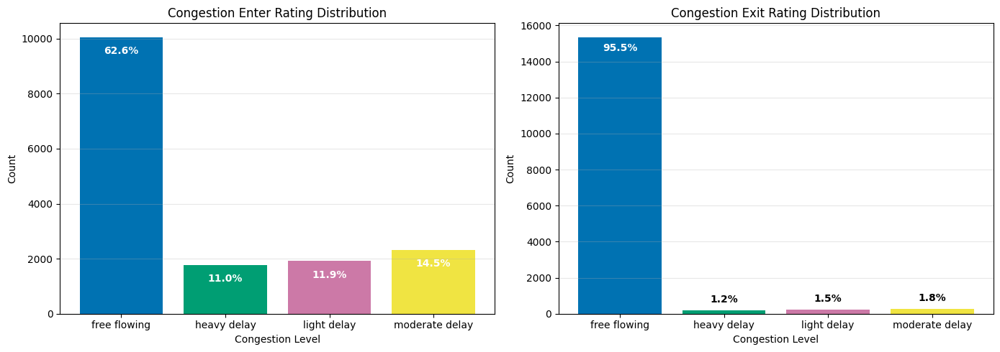

In [30]:
# Define a color palette with visually distinct and complementary colors
colors = ["#0072B2", "#009E73", "#CC79A7", "#F0E442", "#56B4E9"]

def plot_rating_distribution(df, column, ax, title=None):
    """
    Plots a bar chart showing counts of each rating in a column,
    with percentage labels on top of bars. Uses distinct colors.
    """
    counts = df[column].value_counts().sort_index()

    # Assign colors dynamically based on number of categories
    color_list = colors[:len(counts)]

    bars = ax.bar(counts.index, counts.values, color=color_list)

    ax.set_xlabel('Congestion Level')
    ax.set_ylabel('Count')
    if title:
        ax.set_title(title)
    ax.grid(axis='y', alpha=0.3)

    # Add percentage labels inside or just above bars
    total = counts.sum()
    for bar in bars:
        height = bar.get_height()
        pct = height / total * 100
        # Place label slightly below top if bar is too tall
        label_y = height - 0.02 * total if pct > 10 else height + 0.02 * total
        va = 'top' if pct > 10 else 'bottom'
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            label_y,
            f"{pct:.1f}%",
            ha='center',
            va=va,
            color='white' if pct > 10 else 'black',  # white on tall bars, black otherwise
            fontweight='bold'
        )

# Plot both distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

plot_rating_distribution(
    train, 'congestion_enter_rating', axes[0],
    title='Congestion Enter Rating Distribution'
)
plot_rating_distribution(
    train, 'congestion_exit_rating', axes[1],
    title='Congestion Exit Rating Distribution'
)

plt.tight_layout()
plt.show()

In [31]:
# Class balance
print("\nClass Balance Analysis:")
print(
    f"Enter rating - Most common: {train['congestion_enter_rating'].mode()[0]} "
    f"({train['congestion_enter_rating'].value_counts().max() / len(train) * 100:.1f}%)"
)
print(
    f"Exit rating - Most common: {train['congestion_exit_rating'].mode()[0]} "
    f"({train['congestion_exit_rating'].value_counts().max() / len(train) * 100:.1f}%)"
)



Class Balance Analysis:
Enter rating - Most common: free flowing (62.6%)
Exit rating - Most common: free flowing (95.5%)


- Text labels (not numeric) - we'll need to encode these
- Severe class imbalance - especially for exit ratings (95.5% free flowing!)
- Very different distributions - exits are much less congested than entrances
- This imbalance may affect model performance and requires careful handling (e.g. resampling, weighted loss).

## 5.2 Understanding the Camera Structure
The roundabout has 4 cameras monitoring 4 entrances/exits

Each time segment should have recordings from all 4 cameras simultaneously

We need to understand how cameras are labeled and organized

In [32]:
# Extract camera ID from video filename
# Based on the path format: camera_id/camera_id_timestamp.mp4
train['camera_id'] = train['videos'].str.split('/').str[0]

In [33]:
print("\nUnique Cameras:")
print(train['camera_id'].value_counts().sort_index())


Unique Cameras:
camera_id
normanniles1_2025-10-20-06-00-45    1
normanniles1_2025-10-20-06-01-45    1
normanniles1_2025-10-20-06-02-45    1
normanniles1_2025-10-20-06-03-45    1
normanniles1_2025-10-20-06-04-45    1
                                   ..
normanniles4_2025-10-26-17-55-45    1
normanniles4_2025-10-26-17-56-45    1
normanniles4_2025-10-26-17-57-45    1
normanniles4_2025-10-26-17-58-45    1
normanniles4_2025-10-26-17-59-45    1
Name: count, Length: 16076, dtype: int64


In [34]:
# Check if view_label corresponds to camera_id
print("\nView Labels:")
print(train['view_label'].value_counts())


View Labels:
view_label
Norman Niles #1    4019
Norman Niles #2    4019
Norman Niles #3    4019
Norman Niles #4    4019
Name: count, dtype: int64


In [35]:
# Cross-reference camera_id with view_label
print("\nCamera ID vs View Label:")
camera_view_cross = pd.crosstab(train['camera_id'], train['view_label'])
print(camera_view_cross)


Camera ID vs View Label:
view_label                        Norman Niles #1  Norman Niles #2  \
camera_id                                                            
normanniles1_2025-10-20-06-00-45                1                0   
normanniles1_2025-10-20-06-01-45                1                0   
normanniles1_2025-10-20-06-02-45                1                0   
normanniles1_2025-10-20-06-03-45                1                0   
normanniles1_2025-10-20-06-04-45                1                0   
...                                           ...              ...   
normanniles4_2025-10-26-17-55-45                0                0   
normanniles4_2025-10-26-17-56-45                0                0   
normanniles4_2025-10-26-17-57-45                0                0   
normanniles4_2025-10-26-17-58-45                0                0   
normanniles4_2025-10-26-17-59-45                0                0   

view_label                        Norman Niles #3  Norman Niles

In [36]:
# Check how many cameras per time segment
print("\nVideos per Time Segment:")
videos_per_segment = train.groupby('time_segment_id').size()
print(f"Min videos per segment: {videos_per_segment.min()}")
print(f"Max videos per segment: {videos_per_segment.max()}")
print(f"Most common: {videos_per_segment.mode()[0]}")
print(f"\nDistribution:")
print(videos_per_segment.value_counts().sort_index())


Videos per Time Segment:
Min videos per segment: 4
Max videos per segment: 4
Most common: 4

Distribution:
4    4019
Name: count, dtype: int64


In [37]:
# Sample a time segment to see the 4-camera structure
print("\nExample: One Time Segment with All Cameras")
sample_segment = train[train['time_segment_id'] == train['time_segment_id'].iloc[0]]
print(sample_segment[['time_segment_id', 'camera_id', 'view_label', 'video_time',
                       'congestion_enter_rating', 'congestion_exit_rating']])


Example: One Time Segment with All Cameras
       time_segment_id                         camera_id       view_label  \
0                    0  normanniles1_2025-10-20-06-00-45  Norman Niles #1   
4019                 0  normanniles2_2025-10-20-06-00-45  Norman Niles #2   
8038                 0  normanniles3_2025-10-20-06-00-45  Norman Niles #3   
12057                0  normanniles4_2025-10-20-06-00-45  Norman Niles #4   

                video_time congestion_enter_rating congestion_exit_rating  
0      2025-10-20 06:00:45            free flowing           free flowing  
4019   2025-10-20 06:00:45            free flowing           free flowing  
8038   2025-10-20 06:00:45            free flowing           free flowing  
12057  2025-10-20 06:00:45            free flowing           free flowing  


In [38]:
# Do Congestion Ratings Vary Across Cameras?
# This is important: Are we predicting one rating per time segment,
# or do different cameras at the same time have different ratings?

# For each time segment, check if all 4 cameras have the same rating
def check_rating_consistency(group):
    """Check if all cameras in a time segment have the same congestion rating"""
    enter_unique = group['congestion_enter_rating'].nunique()
    exit_unique = group['congestion_exit_rating'].nunique()
    return pd.Series({
        'enter_consistent': enter_unique == 1,
        'exit_consistent': exit_unique == 1,
        'enter_ratings': ', '.join(group['congestion_enter_rating'].unique()),
        'exit_ratings': ', '.join(group['congestion_exit_rating'].unique())
    })

consistency = train.groupby('time_segment_id').apply(check_rating_consistency)

print("\nConsistency Analysis:")
print(f"Time segments where ENTER rating is same across all 4 cameras: {consistency['enter_consistent'].sum()} / {len(consistency)}")
print(f"Time segments where EXIT rating is same across all 4 cameras: {consistency['exit_consistent'].sum()} / {len(consistency)}")



Consistency Analysis:
Time segments where ENTER rating is same across all 4 cameras: 2310 / 4019
Time segments where EXIT rating is same across all 4 cameras: 3660 / 4019


/tmp/ipython-input-1855995712.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  consistency = train.groupby('time_segment_id').apply(check_rating_consistency)


Cameras can have different congestion ratings at the same time. This makes sense - one entrance might be congested while another is free-flowing.

Understanding Camera-Specific Ratings

Since ratings vary by camera, we need to understand the pattern:
- Are certain cameras more congested than others?
- Is there correlation between enter and exit ratings?
- What does the view_label tell us about each camera's position?

In [39]:
# Congestion by camera
print("\nEnter Congestion by Camera:")
camera_enter = pd.crosstab(train['camera_id'], train['congestion_enter_rating'], normalize='index') * 100
print(camera_enter.round(1))

print("\nExit Congestion by Camera:")
camera_exit = pd.crosstab(train['camera_id'], train['congestion_exit_rating'], normalize='index') * 100
print(camera_exit.round(1))


Enter Congestion by Camera:
congestion_enter_rating           free flowing  heavy delay  light delay  \
camera_id                                                                  
normanniles1_2025-10-20-06-00-45         100.0          0.0          0.0   
normanniles1_2025-10-20-06-01-45         100.0          0.0          0.0   
normanniles1_2025-10-20-06-02-45         100.0          0.0          0.0   
normanniles1_2025-10-20-06-03-45         100.0          0.0          0.0   
normanniles1_2025-10-20-06-04-45         100.0          0.0          0.0   
...                                        ...          ...          ...   
normanniles4_2025-10-26-17-55-45           0.0          0.0          0.0   
normanniles4_2025-10-26-17-56-45           0.0          0.0          0.0   
normanniles4_2025-10-26-17-57-45           0.0          0.0        100.0   
normanniles4_2025-10-26-17-58-45           0.0          0.0        100.0   
normanniles4_2025-10-26-17-59-45         100.0          0.0

In [40]:
# Check correlation between enter and exit ratings for same camera
print("\nEnter vs Exit Rating Correlation (Same Camera, Same Time):")
# Create a cross-tabulation
enter_exit_crosstab = pd.crosstab(train['congestion_enter_rating'],
                                   train['congestion_exit_rating'],
                                   margins=True)
print(enter_exit_crosstab)

# Calculate percentage: when enter is congested, what % of time is exit also congested?
print("\nKey Insight:")
non_freeflow_enter = train[train['congestion_enter_rating'] != 'free flowing']
non_freeflow_exit_pct = (non_freeflow_enter['congestion_exit_rating'] != 'free flowing').sum() / len(non_freeflow_enter) * 100
print(f"When entrance has ANY congestion, exit also has congestion {non_freeflow_exit_pct:.1f}% of the time")


Enter vs Exit Rating Correlation (Same Camera, Same Time):
congestion_exit_rating   free flowing  heavy delay  light delay  \
congestion_enter_rating                                           
free flowing                    10042            8            5   
heavy delay                      1276          169           98   
light delay                      1892            5           22   
moderate delay                   2143           17          116   
All                             15353          199          241   

congestion_exit_rating   moderate delay    All  
congestion_enter_rating                         
free flowing                          1  10056  
heavy delay                         230   1773  
light delay                           0   1919  
moderate delay                       52   2328  
All                                 283  16076  

Key Insight:
When entrance has ANY congestion, exit also has congestion 11.8% of the time


- **normanniles4** is the most problematic (only 56% free-flowing enters, 17.6% heavy delay)
- **normanniles3** also challenging (13.3% heavy delay enters)
- Exits are much less congested (93-98% free-flowing across all cameras)
- Enter and exit congestion are weakly correlated (only 11.8% overlap)

This suggests entrances are the bottleneck!

## 5.3 Temporal Structure Analysis
Understanding how videos are sequenced in time is important because:
- We need 15 consecutive minutes as input
- We predict 5 minutes after a 2-minute embargo
- We must respect temporal ordering (no future data leakage)

In [41]:
def add_time_features(df, time_col="video_time"):
    df[time_col] = pd.to_datetime(df[time_col])
    df["day_week"] = df[time_col].dt.day_of_week   # 0=Mon, 6=Sun
    df["hour"] = df[time_col].dt.hour              # 0–23
    df["Date"] = df[time_col].dt.date
    return df

# Apply to both datasets
train = add_time_features(train)
test = add_time_features(test)

# Quick checks
print("Max hour in test:", test["hour"].max())
print("Unique Dates:", train["Date"].unique().tolist())
display(train.head(2))

Max hour in test: 17
Unique Dates: [datetime.date(2025, 10, 20), datetime.date(2025, 10, 21), datetime.date(2025, 10, 22), datetime.date(2025, 10, 23), datetime.date(2025, 10, 24), datetime.date(2025, 10, 25), datetime.date(2025, 10, 26)]


,responseId,view_label,ID_enter,ID_exit,videos,video_time,datetimestamp_start,datetimestamp_end,date,signaling,congestion_enter_rating,congestion_exit_rating,time_segment_id,cycle_phase,video_path,label,camera_id,day_week,hour,Date
0,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #1,time_segment_0_Norman Niles #1_congestion_ente...,time_segment_0_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-00-45,2025-10-20 06:00:45,2025-10-20 06:00:45,2025-10-20 06:01:44,2025-10-20,none,free flowing,free flowing,0,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1,normanniles1_2025-10-20-06-00-45,0,6,2025-10-20
1,NYsHaeCRLq-vnvgPjoXZqA0,Norman Niles #1,time_segment_1_Norman Niles #1_congestion_ente...,time_segment_1_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-01-45,2025-10-20 06:01:45,2025-10-20 06:01:45,2025-10-20 06:02:44,2025-10-20,none,free flowing,free flowing,1,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1,normanniles1_2025-10-20-06-01-45,0,6,2025-10-20


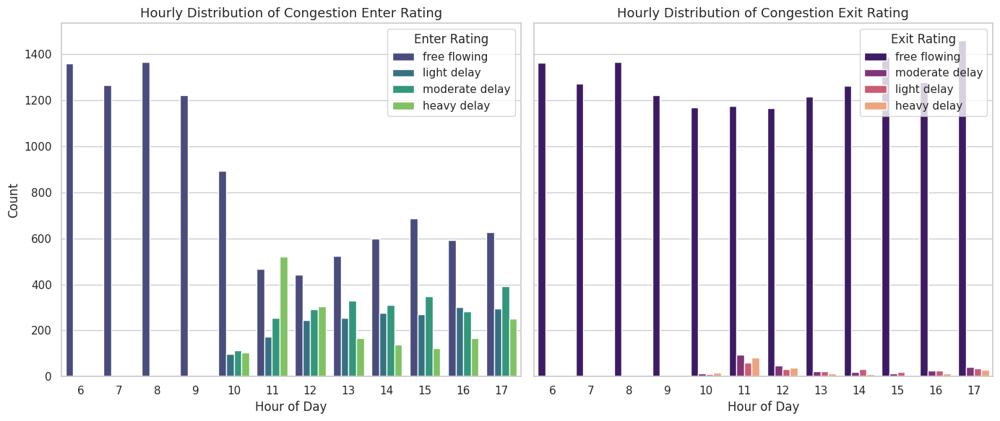

In [42]:
sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(14,6), sharey=True)

# Left plot: congestion_enter_rating by hour
ax1 = sns.countplot(
    x="hour", hue="congestion_enter_rating", data=train,
    palette="viridis", ax=axes[0]
)
ax1.set_title("Hourly Distribution of Congestion Enter Rating", fontsize=13)
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Count")
ax1.legend(title="Enter Rating", loc="upper right")

# Right plot: congestion_exit_rating by hour
ax2 = sns.countplot(
    x="hour", hue="congestion_exit_rating", data=train,
    palette="magma", ax=axes[1]
)
ax2.set_title("Hourly Distribution of Congestion Exit Rating", fontsize=13)
ax2.set_xlabel("Hour of Day")
ax2.set_ylabel("")
ax2.legend(title="Exit Rating", loc="upper right")

plt.tight_layout()
plt.show()

- Recording period: The dataset spans six days, with videos captured between 06:00 and 18:00 each day.

- Congestion levels begin increasing around hour 10 and remain elevated until approximately hour 17.

In [43]:
# Parse timestamps from video filenames
# Format appears to be: camera_id_YYYY-MM-DD-HH-MM-SS.mp4
train['timestamp'] = pd.to_datetime(
    train['videos'].str.extract(r'(\d{4}-\d{2}-\d{2}-\d{2}-\d{2}-\d{2})')[0],
    format='%Y-%m-%d-%H-%M-%S'
)

In [44]:
# check the datetimestamp_start column
print("\nTimestamp Columns Available:")
print(f"datetimestamp_start: {train['datetimestamp_start'].dtype}")
print(f"datetimestamp_end: {train['datetimestamp_end'].dtype}")
print(f"Extracted timestamp from filename: {train['timestamp'].dtype}")

# Compare them


Timestamp Columns Available:
datetimestamp_start: object
datetimestamp_end: object
Extracted timestamp from filename: datetime64[ns]


In [45]:
# Convert to datetime if needed
if train['datetimestamp_start'].dtype == 'object':
    train['datetime'] = pd.to_datetime(train['datetimestamp_start'])
else:
    train['datetime'] = train['datetimestamp_start']

In [46]:
# Sort by time
train = train.sort_values(['datetime', 'camera_id']).reset_index(drop=True)

print("\nTemporal Coverage:")
print(f"Start date: {train['datetime'].min()}")
print(f"End date: {train['datetime'].max()}")
print(f"Total duration: {train['datetime'].max() - train['datetime'].min()}")


Temporal Coverage:
Start date: 2025-10-20 06:00:44
End date: 2025-10-26 17:59:47
Total duration: 6 days 11:59:03


In [47]:
# Check video_time duration
print(f"\nVideo Duration:")
print(f"Unique video_time values: {train['video_time'].unique()}")
print(f"Video time distribution:\n{train['video_time'].value_counts().sort_index()}")


Video Duration:
Unique video_time values: <DatetimeArray>
['2025-10-20 06:00:45', '2025-10-20 06:01:45', '2025-10-20 06:02:45',
 '2025-10-20 06:03:45', '2025-10-20 06:04:45', '2025-10-20 06:05:45',
 '2025-10-20 06:06:45', '2025-10-20 06:07:45', '2025-10-20 06:08:45',
 '2025-10-20 06:09:45',
 ...
 '2025-10-26 17:50:45', '2025-10-26 17:51:45', '2025-10-26 17:52:45',
 '2025-10-26 17:53:45', '2025-10-26 17:54:45', '2025-10-26 17:55:45',
 '2025-10-26 17:56:45', '2025-10-26 17:57:45', '2025-10-26 17:58:45',
 '2025-10-26 17:59:45']
Length: 4019, dtype: datetime64[ns]
Video time distribution:
video_time
2025-10-20 06:00:45    4
2025-10-20 06:01:45    4
2025-10-20 06:02:45    4
2025-10-20 06:03:45    4
2025-10-20 06:04:45    4
                      ..
2025-10-26 17:55:45    4
2025-10-26 17:56:45    4
2025-10-26 17:57:45    4
2025-10-26 17:58:45    4
2025-10-26 17:59:45    4
Name: count, Length: 4019, dtype: int64


## 5.4 Signaling & Congestion Insight

/tmp/ipython-input-458757366.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x="signaling", data=train, palette="viridis")


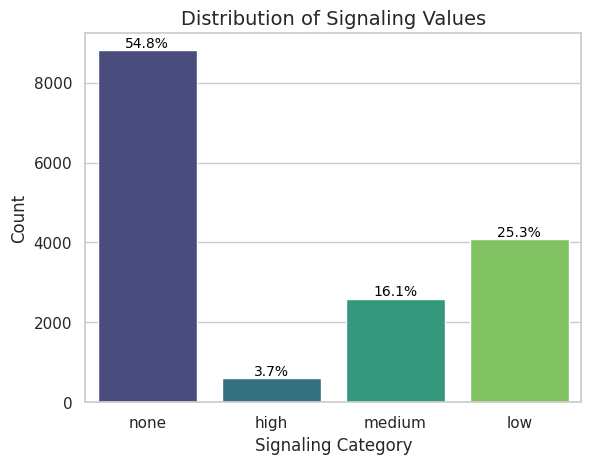

In [48]:
ax = sns.countplot(x="signaling", data=train, palette="viridis")

# Total number of samples
total = len(train)

# Add percentage labels on top of bars
for p in ax.patches:
    height = p.get_height()
    percent = 100 * height / total
    ax.annotate(f'{percent:.1f}%',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', fontsize=10, color='black')
plt.title("Distribution of Signaling Values", fontsize=14)
plt.xlabel("Signaling Category")
plt.ylabel("Count")
plt.show()

- More than half of all vehicles (54.8%) navigate the roundabout without using any turn signals. This represents a significant safety concern and suggests poor driver behavior or awareness at this location.

- There's a clear downward trend as we move from "none" through "low" (25.3%) and "medium" (16.1%) to "high" (3.7%). Only a tiny fraction of drivers are signaling appropriately.

- With nearly 55% of drivers not signaling at all and another 25% showing low signaling behavior, approximately 80% of roundabout users are either not signaling or signaling inadequately. This creates predictability issues for other road users.

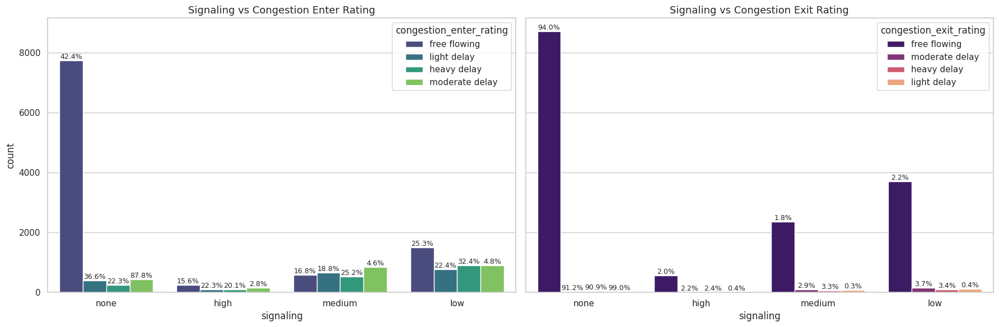

In [49]:
def add_percentages(ax, data, x_col, hue_col):
    # Calculate percentages
    contingency_table = (
        pd.crosstab(data[x_col], data[hue_col], normalize='index') * 100
    )

    bars = ax.patches
    x_categories = list(contingency_table.index)
    hue_categories = list(contingency_table.columns)

    n_hues = len(hue_categories)

    for i, bar in enumerate(bars):
        height = bar.get_height()

        x_index = i // n_hues
        hue_index = i % n_hues

        # Guard: skip if index is out of range
        if x_index >= len(x_categories):
            continue

        x_label = x_categories[x_index]
        hue_value = hue_categories[hue_index]

        percent = contingency_table.loc[x_label, hue_value]

        if height > 0:
            ax.annotate(
                f"{percent:.1f}%",
                (bar.get_x() + bar.get_width() / 2., height),
                ha="center", va="bottom", fontsize=9
            )


fig, axes = plt.subplots(1, 2, figsize=(18,6), sharey=True)

# --- Left plot ---
ax1 = sns.countplot(
    x="signaling", hue="congestion_enter_rating",
    data=train, palette="viridis", ax=axes[0]
)
ax1.set_title("Signaling vs Congestion Enter Rating", fontsize=13)
add_percentages(ax1, train, "signaling", "congestion_enter_rating")

# --- Right plot ---
ax2 = sns.countplot(
    x="signaling", hue="congestion_exit_rating",
    data=train, palette="magma", ax=axes[1]
)
ax2.set_title("Signaling vs Congestion Exit Rating", fontsize=13)
add_percentages(ax2, train, "signaling", "congestion_exit_rating")

plt.tight_layout()
plt.show()


In [50]:
# Ensure consistent encoding of the 'signaling' categories across both train and test sets.
# We first extract all unique categories from the combined data, then convert the column in each
# dataset into an ordered categorical type using this full set. Finally, we encode them as integer
# codes so that train and test use the same numeric representation for each category.


# Define categories from combined data
categories = pd.concat([train['signaling'], test['signaling']]).unique()
train['signaling'] = pd.Categorical(train['signaling'], categories=categories).codes
test['signaling']  = pd.Categorical(test['signaling'], categories=categories).codes

# 6. Feature Extraction From The Videos

In [51]:
# Install required libraries
!pip install -q ultralytics opencv-python-headless
!pip install -q ultralytics opencv-python-headless scipy
!pip install -q scipy  # For optical flow calculations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.9 MB/s eta 0:00:00


In [52]:
# Import libraries
import cv2
import numpy as np
from ultralytics import YOLO
from scipy.spatial.distance import euclidean
import torch

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [53]:
# Load pre-trained YOLO model (we'll use YOLOv8 - lightweight and accurate)
# Use YOLOv8n
model = YOLO("yolov8n.pt")

## 6.1 FEATURE EXTRACTION PIPELINE DESIGN

For each 1-minute traffic video, we extract congestion-relevant features using a lightweight YOLO-based pipeline. To balance accuracy and runtime across more than 18,000 videos, we process one frame every 10 frames, use YOLO nano, and compute flow and congestion metrics without expensive tracking.


1.COUNTING FEATURES

We extract the total presence of vehicles:

Total vehicles detected

Vehicles by type (car, bus, truck, motorcycle)

Mean number of vehicles per processed frame

Max and min vehicles per frame

These are core indicators of overall traffic volume.



2.FLOW FEATURES (movement-based)

Without full tracking, we approximate motion using centroid movement:

Vehicles entering the scene (moving downward in the frame)

Vehicles exiting the scene (moving upward)

Flow rate = vehicles entering + exiting per minute

These capture directional traffic flow.


3.CONGESTION INDICATORS

We compute congestion-specific metrics:

Average speed proxy using centroid displacement

Queue length = # of vehicles barely moving across frames

Density = total vehicle count / frames processed

Stopped vehicles proportion

Variability (std of vehicles per frame) for turbulence vs smooth flow

These distinguish free-flowing vs slow or jammed traffic.


4.TEMPORAL FEATURES

We track how traffic changes during the minute:

Traffic trend (increasing or decreasing)

Variance in counts

Whether congestion builds up, clears, or stays stable

All features are aggregated so the ML model gets a compact representation per video.

Optimized Feature Extraction Code (with batching + added features)

In [54]:
train

,responseId,view_label,ID_enter,ID_exit,videos,video_time,datetimestamp_start,datetimestamp_end,date,signaling,...,time_segment_id,cycle_phase,video_path,label,camera_id,day_week,hour,Date,timestamp,datetime
0,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #3,time_segment_0_Norman Niles #3_congestion_ente...,time_segment_0_Norman Niles #3_congestion_exit...,normanniles3_2025-10-20-06-00-45,2025-10-20 06:00:45,2025-10-20 06:00:44,2025-10-20 06:01:43,2025-10-20,0,...,0,train,gs://brb-traffic/normanniles3/normanniles3_202...,normanniles3,normanniles3_2025-10-20-06-00-45,0,6,2025-10-20,2025-10-20 06:00:45,2025-10-20 06:00:44
1,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #4,time_segment_0_Norman Niles #4_congestion_ente...,time_segment_0_Norman Niles #4_congestion_exit...,normanniles4_2025-10-20-06-00-45,2025-10-20 06:00:45,2025-10-20 06:00:44,2025-10-20 06:01:43,2025-10-20,0,...,0,train,gs://brb-traffic/normanniles4/normanniles4_202...,normanniles4,normanniles4_2025-10-20-06-00-45,0,6,2025-10-20,2025-10-20 06:00:45,2025-10-20 06:00:44
2,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #1,time_segment_0_Norman Niles #1_congestion_ente...,time_segment_0_Norman Niles #1_congestion_exit...,normanniles1_2025-10-20-06-00-45,2025-10-20 06:00:45,2025-10-20 06:00:45,2025-10-20 06:01:44,2025-10-20,0,...,0,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1,normanniles1_2025-10-20-06-00-45,0,6,2025-10-20,2025-10-20 06:00:45,2025-10-20 06:00:45
3,zYkHaeOdB7XOnvgP3YW5kQs,Norman Niles #2,time_segment_0_Norman Niles #2_congestion_ente...,time_segment_0_Norman Niles #2_congestion_exit...,normanniles2_2025-10-20-06-00-45,2025-10-20 06:00:45,2025-10-20 06:00:45,2025-10-20 06:01:44,2025-10-20,0,...,0,train,gs://brb-traffic/normanniles2/normanniles2_202...,normanniles2,normanniles2_2025-10-20-06-00-45,0,6,2025-10-20,2025-10-20 06:00:45,2025-10-20 06:00:45
4,NYsHaeCRLq-vnvgPjoXZqA0,Norman Niles #4,time_segment_1_Norman Niles #4_congestion_ente...,time_segment_1_Norman Niles #4_congestion_exit...,normanniles4_2025-10-20-06-01-45,2025-10-20 06:01:45,2025-10-20 06:01:44,2025-10-20 06:02:43,2025-10-20,1,...,1,train,gs://brb-traffic/normanniles4/normanniles4_202...,normanniles4,normanniles4_2025-10-20-06-01-45,0,6,2025-10-20,2025-10-20 06:01:45,2025-10-20 06:01:44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16071,0okHabnnG-K2nvgPsZGZ4Aw,Norman Niles #2,time_segment_4985_Norman Niles #2_congestion_e...,time_segment_4985_Norman Niles #2_congestion_e...,normanniles2_2025-10-26-17-58-45,2025-10-26 17:58:45,2025-10-26 17:58:47,2025-10-26 17:59:46,2025-10-26,0,...,4985,train,gs://brb-traffic/normanniles2/normanniles2_202...,normanniles2,normanniles2_2025-10-26-17-58-45,6,17,2025-10-26,2025-10-26 17:58:45,2025-10-26 17:58:47
16072,aYwHae2SDrXOnvgP3YW5kQs,Norman Niles #3,time_segment_4986_Norman Niles #3_congestion_e...,time_segment_4986_Norman Niles #3_congestion_e...,normanniles3_2025-10-26-17-59-45,2025-10-26 17:59:45,2025-10-26 17:59:39,2025-10-26 18:00:59,2025-10-26,0,...,4986,train,gs://brb-traffic/normanniles3/normanniles3_202...,normanniles3,normanniles3_2025-10-26-17-59-45,6,17,2025-10-26,2025-10-26 17:59:45,2025-10-26 17:59:39
16073,aYwHae2SDrXOnvgP3YW5kQs,Norman Niles #4,time_segment_4986_Norman Niles #4_congestion_e...,time_segment_4986_Norman Niles #4_congestion_e...,normanniles4_2025-10-26-17-59-45,2025-10-26 17:59:45,2025-10-26 17:59:39,2025-10-26 18:00:59,2025-10-26,0,...,4986,train,gs://brb-traffic/normanniles4/normanniles4_202...,normanniles4,normanniles4_2025-10-26-17-59-45,6,17,2025-10-26,2025-10-26 17:59:45,2025-10-26 17:59:39
16074,aYwHae2SDrXOnvgP3YW5kQs,Norman Niles #1,time_segment_4986_Norman Niles #1_congestion_e...,time_segment_4986_Norman Niles #1_congestion_e...,normanniles1_2025-10-26-17-59-45,2025-10-26 17:59:45,2025-10-26 17:59:42,2025-10-26 18:00:58,2025-10-26,0,...,4986,train,gs://brb-traffic/normanniles1/normanniles1_202...,normanniles1,normanniles1_2025-10-26-17-59-45,6,17,2025-10-26,2025-10-26 17

In [55]:
def extract_features_from_gcs_video(blob_name, bucket_name, model, sample_rate=2, speed_threshold=2):
    """
    Extract traffic features from a Google Cloud Storage video without storing it permanently.

    Parameters:
    -----------
    blob_name : str
        Path to the video in the GCS bucket.
    bucket_name : str
        Name of the GCS bucket.
    model : YOLO
        Pre-trained YOLO model.
    sample_rate : int
        Process every Nth frame for efficiency.
    speed_threshold : float
        Pixel movement threshold to flag vehicles as queued (stationary/congested).

    Returns:
    --------
    dict
        Dictionary containing aggregated features:
        - Counting: total vehicles, vehicles by type
        - Temporal: vehicles per frame
        - Flow: centroid history for calculating speed/flow
        - Congestion: queue flags for slow-moving vehicles
    """

    # Define vehicle classes in COCO dataset (what YOLO uses)
    VEHICLE_CLASSES = {2: 'car', 3: 'motorcycle', 5: 'bus', 7: 'truck'}

    # Initialize feature storage
    features = {
        'video_path': blob_name,
        'total_vehicles': 0,
        'car_count': 0,
        'truck_count': 0,
        'bus_count': 0,
        'motorcycle_count': 0,

        # Lists to store per-frame and temporal info
        'vehicles_per_frame': [],    # Number of vehicles in each frame
        'centroid_history': [],      # List of (x, y) centroids per vehicle per frame
        'queue_flags': [],           # Flags indicating slow-moving vehicles per frame

        'total_frames_processed': 0
    }

    try:

        # Download video temporarily from GCS

        blob = client.bucket(bucket_name).blob(blob_name)
        with tempfile.NamedTemporaryFile(suffix=".mp4", delete=False) as tmp:
            tmp.write(blob.download_as_bytes())
            temp_path = tmp.name

        # Open video with OpenCV
        cap = cv2.VideoCapture(temp_path)
        if not cap.isOpened():
            print(f"Could not open video: {blob_name}")
            os.unlink(temp_path)
            return None

        frame_idx = 0
        prev_centroids = []  # Store centroids from previous frame for speed/queue detection

        while True:
            ret, frame = cap.read()
            if not ret:
                break

            # Skip frames to reduce computation
            if frame_idx % sample_rate != 0:
                frame_idx += 1
                continue

            # Run YOLO detection on current frame
            results = model(frame, verbose=False)

            frame_vehicle_count = 0
            frame_centroids = []  # Current frame centroids
            frame_queue_flags = []  # Queue flags for this frame

            # Loop through detected boxes
            for box in results[0].boxes:
                class_id = int(box.cls[0])

                # Only process vehicles
                if class_id in VEHICLE_CLASSES:
                    # Update counting features
                    features['total_vehicles'] += 1
                    frame_vehicle_count += 1
                    vehicle_type = VEHICLE_CLASSES[class_id]
                    features[f'{vehicle_type}_count'] += 1

                    # Compute box centroid
                    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                    centroid_x = (x1 + x2) / 2
                    centroid_y = (y1 + y2) / 2
                    frame_centroids.append((centroid_x, centroid_y))

            # Compute queue flags based on movement from previous frame
            if prev_centroids:
                # Simple approach: compare nearest previous centroid to current centroid
                for c in frame_centroids:
                    distances = [np.linalg.norm(np.array(c) - np.array(pc)) for pc in prev_centroids]
                    min_distance = min(distances) if distances else 0
                    frame_queue_flags.append(min_distance < speed_threshold)
            else:
                # No previous frame → no queue info
                frame_queue_flags = [False] * len(frame_centroids)

            # Store per-frame data
            features['vehicles_per_frame'].append(frame_vehicle_count)
            features['centroid_history'].append(frame_centroids)
            features['queue_flags'].append(frame_queue_flags)

            # Prepare for next frame
            prev_centroids = frame_centroids
            features['total_frames_processed'] += 1
            frame_idx += 1

        # Release video capture and remove temporary file
        cap.release()
        os.unlink(temp_path)

        # Aggregate temporal features

        if features['vehicles_per_frame']:
            features['avg_vehicles_per_frame'] = np.mean(features['vehicles_per_frame'])
            features['max_vehicles_per_frame'] = np.max(features['vehicles_per_frame'])
            features['min_vehicles_per_frame'] = np.min(features['vehicles_per_frame'])
            features['std_vehicles_per_frame'] = np.std(features['vehicles_per_frame'])
        else:
            features.update({'avg_vehicles_per_frame': 0, 'max_vehicles_per_frame': 0,
                             'min_vehicles_per_frame': 0, 'std_vehicles_per_frame': 0})

        return features

    except Exception as e:
        print(f"Error processing {blob_name}: {str(e)}")
        if 'temp_path' in locals():
            try: os.unlink(temp_path)
            except: pass
        return None


In [56]:
def process_videos_in_batches(
    video_list,
    bucket_name,
    model,
    batch_size=100,
    output_file='video_features.csv',
    sample_rate=2,
    start_from_index=None      # NEW: force start index (ex: 200 to start from video 201)
):
    """
    Process videos in batches, save incremental CSVs, and safely resume progress.

    Parameters:
    -----------
    video_list : list
        List of all video paths (strings)
    bucket_name : str
        GCS bucket name
    model : YOLO
        Loaded YOLO model
    batch_size : int
        Save after every N videos
    output_file : str
        Where to save feature CSV
    sample_rate : int
        Process every Nth frame
    start_from_index : int or None
        If provided, forced index to start processing from
        Example: start_from_index=200 means start at video_list[200]
    """

    # -------------------------------------------------------------
    # 1. Load existing CSV if it exists (resume mode)
    # -------------------------------------------------------------
    if os.path.exists(output_file):
        existing_features = pd.read_csv(output_file)
        processed_videos = set(existing_features['video_path'].tolist())
        print(f"Found existing CSV with {len(processed_videos)} processed videos. Resuming...")
    else:
        existing_features = None
        processed_videos = set()
        print("No previous CSV found. Starting fresh extraction...")

    # -------------------------------------------------------------
    # 2. Filter videos:
    #    A. remove those already processed (resume automatically)
    #    B. optionally skip the first N videos (start_from_index)
    # -------------------------------------------------------------
    remaining_videos = [v for v in video_list if v not in processed_videos]

    if start_from_index is not None:
        remaining_videos = remaining_videos[start_from_index:]
        print(f"Forced start from index {start_from_index}. Remaining videos: {len(remaining_videos)}")

    all_features = []

    # Track time for ETA calculation
    start_time = time.time()

    # -------------------------------------------------------------
    # 3. Main extraction loop
    # -------------------------------------------------------------
    for i, video_path in enumerate(remaining_videos):

        print(f"Processing: {video_path}")

        # Extract features for this video
        features = extract_features_from_gcs_video(
            blob_name=video_path,
            bucket_name=bucket_name,
            model=model,
            sample_rate=sample_rate
        )

        # Only save valid results
        if features:
            all_features.append(features)

        # ---------------------------------------------------------
        # Progress every 10 videos
        # ---------------------------------------------------------
        if (i + 1) % 10 == 0:
            elapsed = time.time() - start_time
            rate = (i + 1) / elapsed
            remaining_time = (len(remaining_videos) - i - 1) / rate if rate > 0 else 0
            print(f"✓ {i+1}/{len(remaining_videos)} | ETA: {remaining_time/60:.1f} minutes")

        # ---------------------------------------------------------
        # 4. Save batch every batch_size videos (or at end)
        # ---------------------------------------------------------
        if (i + 1) % batch_size == 0 or (i + 1) == len(remaining_videos):

            if all_features:  # only write if we have new data
                batch_df = pd.DataFrame(all_features)

                # Combine old + new
                if existing_features is not None:
                    combined_df = pd.concat([existing_features, batch_df], ignore_index=True)
                else:
                    combined_df = batch_df

                # Write CSV
                combined_df.to_csv(output_file, index=False)
                print(f"Saved batch → {output_file} ({len(combined_df)} videos total)")

                # Reset state
                existing_features = combined_df
                all_features = []

            # Memory cleanup
            gc.collect()

    print("\n✔ Feature extraction complete!")
    return existing_features


In [57]:
# Make sure 'videos' column has correct folder + filename + .mp4
train['videos_full'] = train['videos'].apply(lambda x: f"{x}.mp4" if not x.endswith('.mp4') else x)

# Also check if folder is included; if not, prepend:
# Example if your video column looks like 'normanniles3_2025-10-20-07-05-45.mp4'
train['videos_full'] = train.apply(
    lambda row: f"{row['video_path'].split('/')[-2]}/{row['videos_full']}"
                if '/' not in row['videos_full'] else row['videos_full'], axis=1
)


In [ ]:
all_videos = train['videos_full'].tolist()
features_df = process_videos_in_batches(
    video_list=all_videos,
    bucket_name=bucket_name,
    model=model,
    batch_size=100,                  # Save every 100 videos
    output_file='video_features_full.csv',
    sample_rate=2,
    start_from_index=400
)

No previous CSV found. Starting fresh extraction...
Forced start from index 400. Remaining videos: 15676
Processing: normanniles3/normanniles3_2025-10-20-07-40-45.mp4
Processing: normanniles4/normanniles4_2025-10-20-07-40-45.mp4
Processing: normanniles1/normanniles1_2025-10-20-07-40-45.mp4
Processing: normanniles2/normanniles2_2025-10-20-07-40-45.mp4
Processing: normanniles3/normanniles3_2025-10-20-07-41-45.mp4
Processing: normanniles4/normanniles4_2025-10-20-07-41-45.mp4
Processing: normanniles1/normanniles1_2025-10-20-07-41-45.mp4
Processing: normanniles2/normanniles2_2025-10-20-07-41-45.mp4
Processing: normanniles3/normanniles3_2025-10-20-07-42-45.mp4
Processing: normanniles4/normanniles4_2025-10-20-07-42-45.mp4
✓ 10/15676 | ETA: 28580.8 minutes
Processing: normanniles1/normanniles1_2025-10-20-07-42-45.mp4
Processing: normanniles2/normanniles2_2025-10-20-07-42-45.mp4
Processing: normanniles3/normanniles3_2025-10-20-07-43-45.mp4
Processing: normanniles4/normanniles4_2025-10-20-07-43-